# Import

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import fastai
from fastai.imports import *
from fastai.basics import *
from fastai.metrics import accuracy
from fastai.torch_core import *
from fastai.vision import *
fastai.__version__

'1.0.51'

In [3]:
from fastai_audio import *

# Data

Download https://goo.gl/8hY5ER

website https://urbansounddataset.weebly.com/urbansound8k.html

Paper https://arxiv.org/pdf/1608.04363.pdf

In [4]:
FASTAI_DATASET_PATH = Path(Config().data_path())
data_path = FASTAI_DATASET_PATH/"UrbanSound8k"
data_path

WindowsPath('D:/.fastai/data/UrbanSound8k')

Get metadata

In [5]:
metadata = pd.read_csv(data_path/"metadata"/"UrbanSound8k.csv")
metadata["relative_path"] = metadata.apply(lambda x: os.path.join("audio", "fold"+str(x["fold"]), x["slice_file_name"]), axis=1)
metadata["duration"] = metadata["end"] - metadata["start"]
metadata.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class,relative_path,duration
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark,audio\fold5\100032-3-0-0.wav,0.317551
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing,audio\fold5\100263-2-0-117.wav,4.000000
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing,audio\fold5\100263-2-0-121.wav,4.000000
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing,audio\fold5\100263-2-0-126.wav,4.000000
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing,audio\fold5\100263-2-0-137.wav,4.000000


Merge metadata with relative file path

In [7]:
# Shuffle the data

metadata = metadata.sample(frac=1).reset_index(drop=True)
metadata.tail()

,slice_file_name,fsID,start,end,salience,fold,classID,class,relative_path,duration
8727,24347-8-0-59.wav,24347,33.620371,37.620371,2,4,8,siren,audio\fold4\24347-8-0-59.wav,4.0
8728,161129-4-0-16.wav,161129,16.275687,20.275687,1,8,4,drilling,audio\fold8\161129-4-0-16.wav,4.0
8729,100652-3-0-3.wav,100652,1.500000,5.500000,1,2,3,dog_bark,audio\fold2\100652-3-0-3.wav,4.0
8730,35548-9-1-14.wav,35548,73.866412,77.866412,2,6,9,street_music,audio\fold6\35548-9-1-14.wav,4.0
8731,39970-9-0-98.wav,39970,52.690714,56.690714,1,2,9,street_music,audio\fold2\39970-9-0-98.wav,4.0


In [8]:
metadata.groupby("class")["class"].count()/metadata.shape[0]

class
air_conditioner     0.114521
car_horn            0.049130
children_playing    0.114521
dog_bark            0.114521
drilling            0.114521
engine_idling       0.114521
gun_shot            0.042831
jackhammer          0.114521
siren               0.106390
street_music        0.114521
Name: class, dtype: float64

# Dataloader

In [9]:
from fastai_audio import *

n_fft = 512 # output of fft will have shape [513 x n_frames]
n_hop = 160  # width of Spectogram = max_seconds * sample rate / n_hop
n_mels = 128 # Height of spectogram
sample_rate = 48000
convert_to_mono=False
max_seconds = 4
f_min=0
f_max=None#8000
noise_scl=0.0005
top_db=80.

train_tfms = get_data_augmentation_transforms(sample_rate=sample_rate, max_seconds=max_seconds, 
                                              convert_to_mono=convert_to_mono,
                                              noise_scl=noise_scl)
valid_tfms = get_data_augmentation_transforms(sample_rate=sample_rate, max_seconds=max_seconds, 
                                              convert_to_mono=convert_to_mono)

dl_tfms = get_frequency_batch_transforms(n_fft=n_fft, n_hop=n_hop,
                                            n_mels=n_mels, top_db=top_db,
                                            f_min=f_min, f_max=f_max,
                                            sample_rate=sample_rate)

C:\ProgramData\Anaconda3\lib\site-packages\librosa\filters.py:284: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  warnings.warn('Empty filters detected in mel frequency basis. '


In [10]:
%%time
#%%prun
from fastai_audio import *
batch_size = 50

audios = (AudioItemList.from_df(df=metadata, path=data_path, cols="relative_path", using_librosa=True)
          .split_by_rand_pct(0.1)
          .label_from_df(cols="class")
          .transform(tfms=(train_tfms, valid_tfms))
          .databunch(bs=batch_size, tfms=dl_tfms, num_workers=3)
         ).normalize()

Wall time: 23.6 s


In [11]:
audios.c, len(audios.train_ds), len(audios.valid_ds)

(10, 7859, 873)

# Look at data from dataloader

In [12]:
xs, ys = audios.one_batch()
print(xs.shape, ys.shape)
del xs, ys

torch.Size([50, 2, 128, 1201]) torch.Size([50])


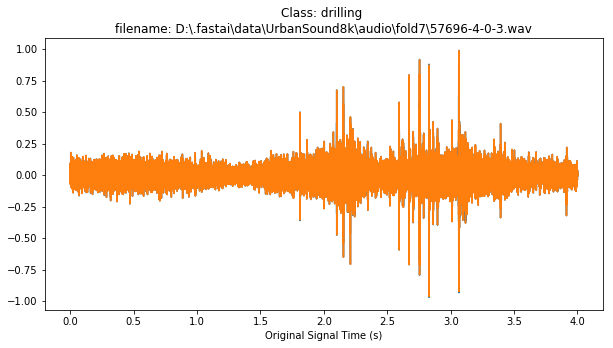

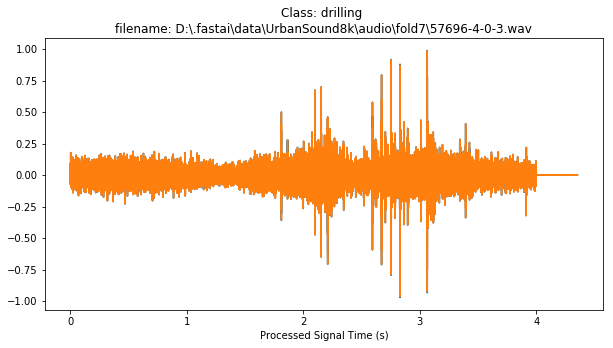

'Original signal'

'Processed signal'

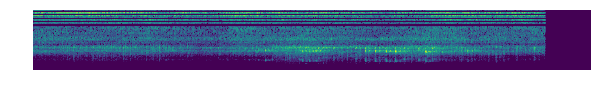

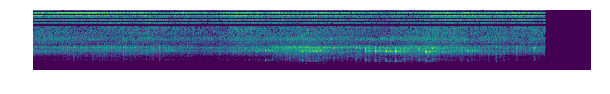

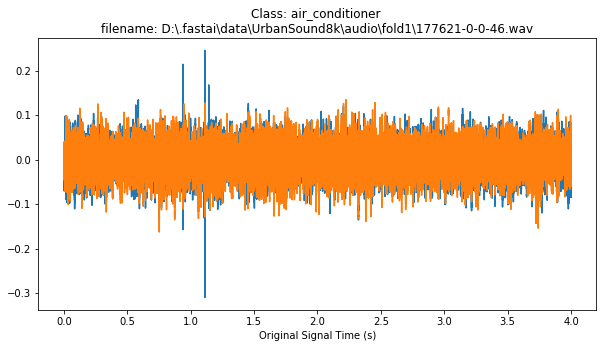

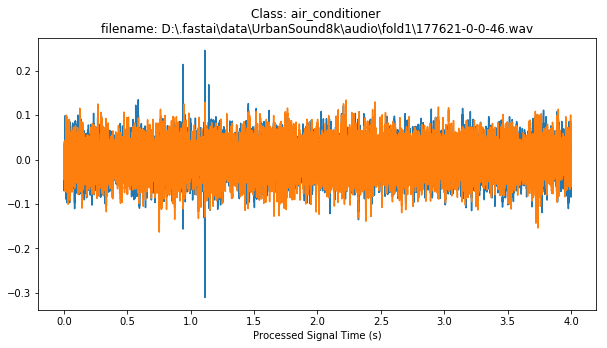

'Original signal'

'Processed signal'

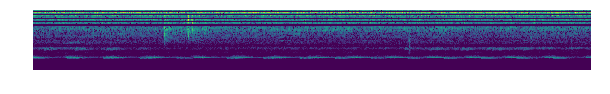

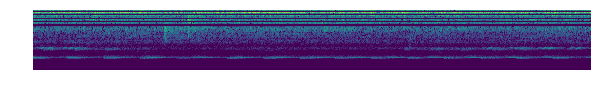

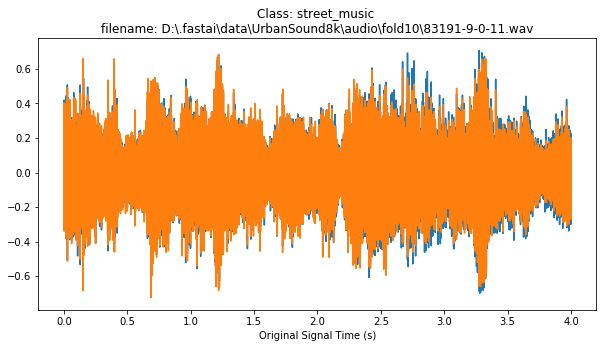

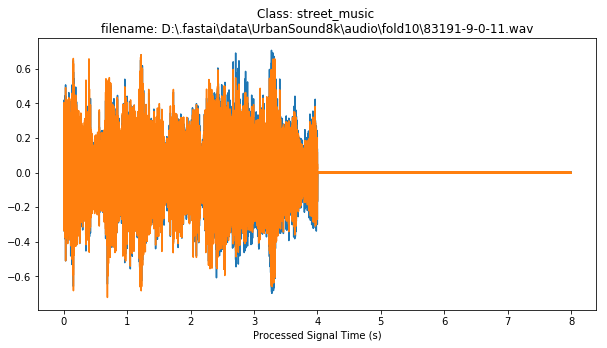

'Original signal'

'Processed signal'

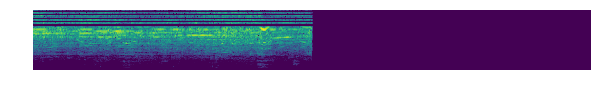

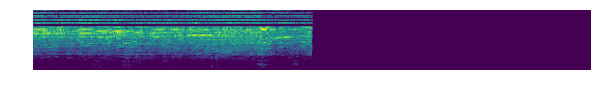

In [13]:
audios.show_batch(3, ds_type=DatasetType.Train, figsize=(10, 5))

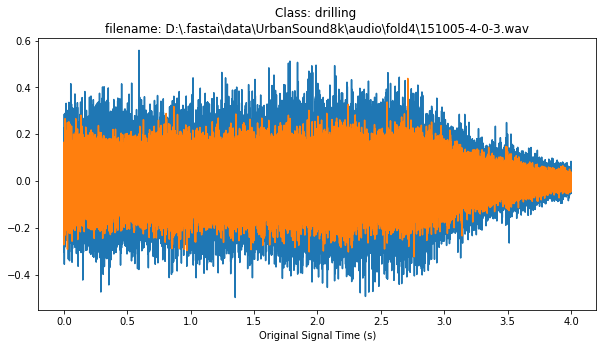

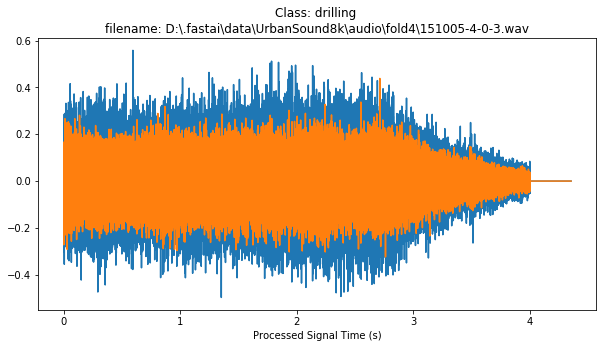

'Original signal'

'Processed signal'

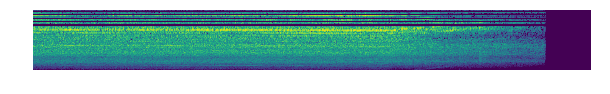

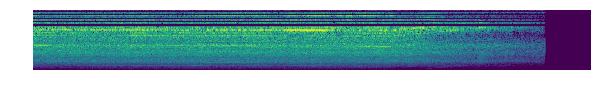

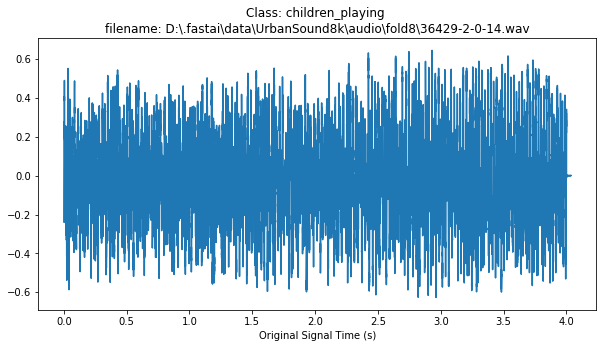

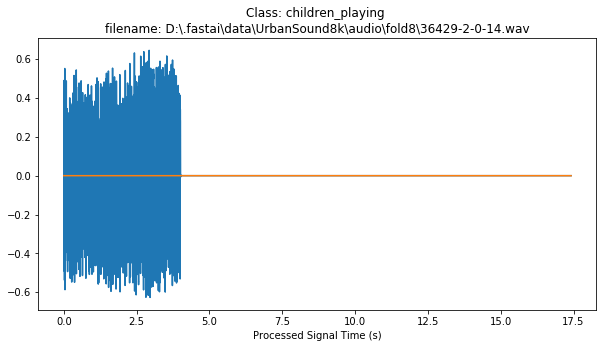

'Original signal'

'Processed signal'

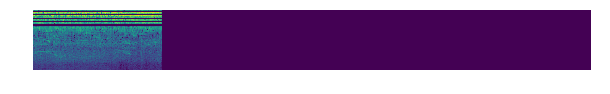

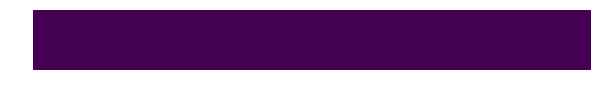

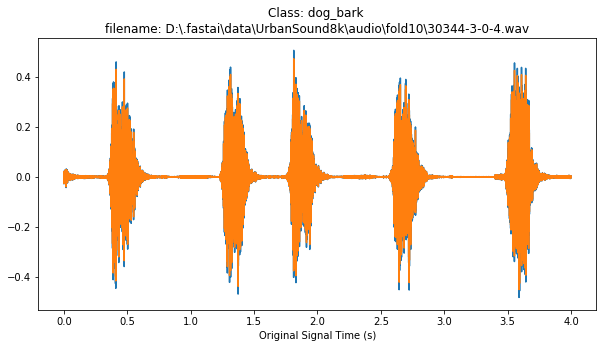

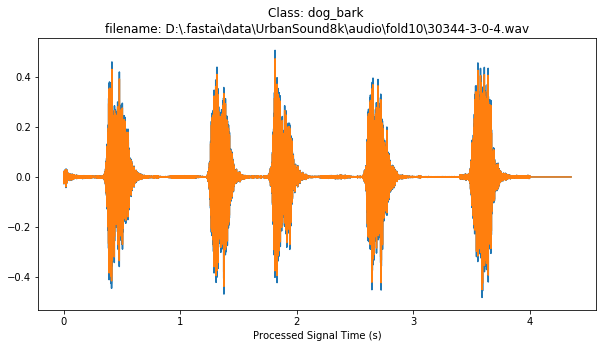

'Original signal'

'Processed signal'

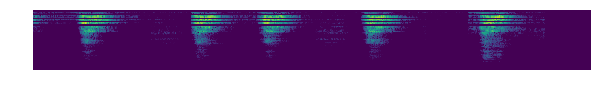

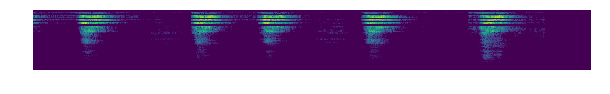

In [14]:
audios.show_batch(3, ds_type=DatasetType.Valid, figsize=(10, 5))

# Model

In [15]:
learn = create_cnn(audios, models.resnet18, metrics=accuracy, pretrained=False, is_mono_input=False, wd=1e-2)

In [16]:
#learn.model

# Training

In [17]:
%%time
learn.fit_one_cycle(8, max_lr=3e-3)

epoch,train_loss,valid_loss,accuracy,time
0,1.342588,1.346206,0.587629,02:53
1,0.939611,1.432414,0.558992,02:53
2,0.701573,1.181937,0.604811,02:50
3,0.530258,0.536760,0.832761,02:54
4,0.395802,0.286945,0.900344,02:54
5,0.243704,0.182499,0.938144,03:00
6,0.115641,0.135488,0.959908,02:52
7,0.059396,0.129323,0.957617,03:04


Wall time: 23min 22s


In [18]:
learn.save("stage-1")

In [24]:
learn = learn.load("stage-1")

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


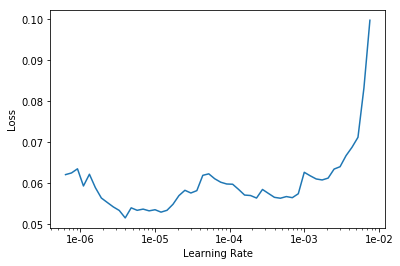

In [25]:
learn.lr_find()
learn.recorder.plot()

In [28]:
learn.fit_one_cycle(4, max_lr=slice(9e-5, 3e-4))

epoch,train_loss,valid_loss,accuracy,time
0,0.051602,0.132425,0.961054,03:04
1,0.050690,0.125438,0.962199,03:00
2,0.038211,0.126306,0.967927,02:53
3,0.024899,0.123841,0.969072,02:52


In [29]:
learn.save("stage-2")

In [30]:
learn = learn.load("stage-2")

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


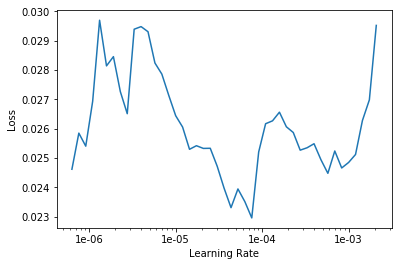

In [31]:
learn.lr_find()
learn.recorder.plot()

In [32]:
learn.fit_one_cycle(8, max_lr=slice(1e-6, 3e-5))

epoch,train_loss,valid_loss,accuracy,time
0,0.025812,0.120978,0.967927,03:01
1,0.025728,0.121968,0.967927,02:59
2,0.022014,0.122978,0.966781,02:59
3,0.021955,0.123411,0.965636,02:57
4,0.021397,0.121918,0.964490,02:52
5,0.023662,0.119737,0.964490,02:51
6,0.022355,0.123482,0.964490,02:52
7,0.021190,0.116842,0.967927,02:53


In [34]:
learn.save("stage-3")

In [35]:
learn = learn.load("stage-3")

# Results & Interpretation

Using a transfer learning approach from ImageNet dataset to UrbanSound8k increase the training speed.

Results: 96.8% without CV

Benchmark 97.5% with CV

https://www.kdd.org/kdd2018/files/deep-learning-day/DLDay18_paper_30.pdf

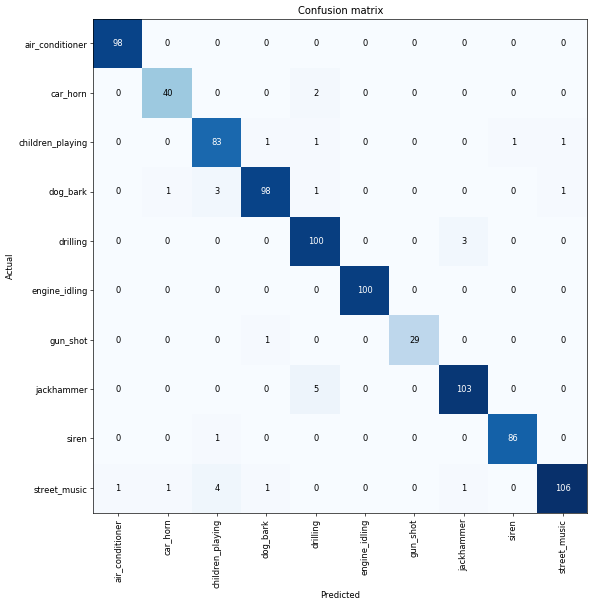

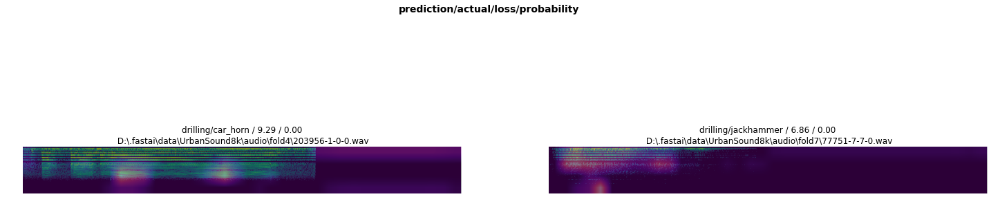

In [37]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(10, 10), dpi=60)
interp.plot_audio_top_losses(2)